# 658 : Visualization - Term Project

## Principal Component Analysis Visualization - MNIST Dataset
### By - Sai Jyothi Ongole - so70@uakron.edu

In [1]:
#import necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
sb.set(style='dark', context='notebook', rc={'figure.figsize':(14,10)})
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

In [2]:
train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')
train.head()

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


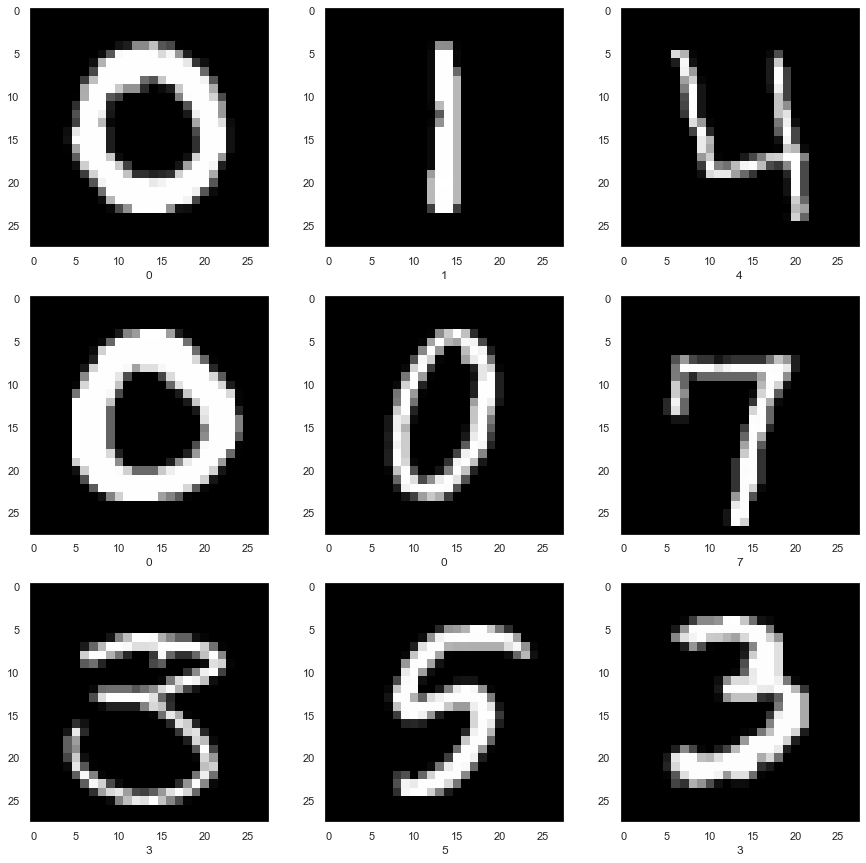

In [3]:
labels = train['label']
sd = train.drop('label', axis = 1)

fig = plt.figure(figsize=(15,15))
for i in range(1,10,1):
    plt.subplot(3,3,i)
    image = sd.iloc[i].to_numpy().reshape(28,28)
    plt.imshow(image,cmap = 'gray')
    plt.xlabel(labels[i])
plt.show()

In [4]:
X = train.loc[:,'pixel0':].values
y = train.loc[:,'label'].values
scaled_data = StandardScaler().fit_transform(X)
scaled_data.shape

(42000, 784)

In [5]:
pca = PCA(n_components=2) 
principalComponents = pca.fit_transform(scaled_data)
principal_df = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2'])
principal_df.shape

(42000, 2)

In [6]:
print('Variance per principal component: {}'.format(pca.explained_variance_ratio_))

Variance per principal component: [0.05747953 0.04111691]


Text(0, 0.5, 'Principal Component 2')

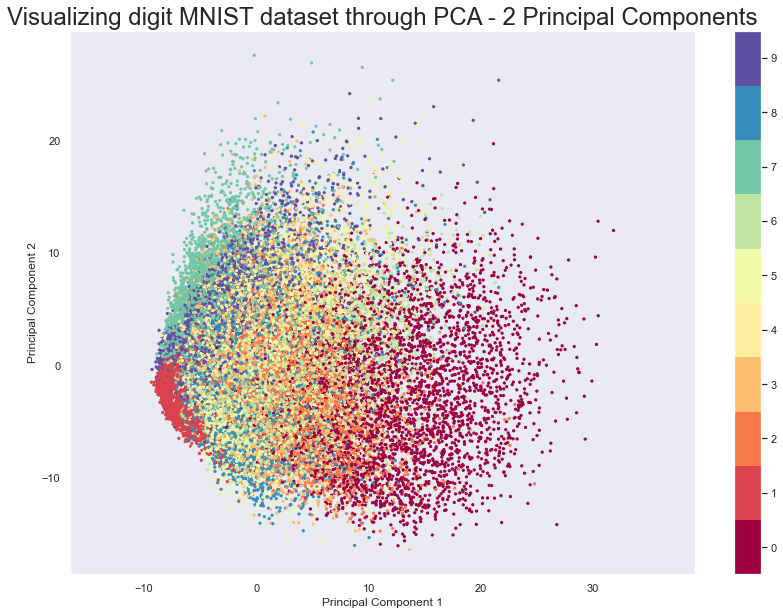

In [7]:
plt.scatter(principalComponents[:, 0], principalComponents[:, 1], s= 5, c=y, cmap='Spectral')
plt.gca().set_aspect('equal', 'datalim')
plt.colorbar(boundaries=np.arange(11)-0.5).set_ticks(np.arange(10))
plt.title('Visualizing digit MNIST dataset through PCA - 2 Principal Components', fontsize=24);
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')

In [8]:
pca2 = PCA(n_components=3) 
principalComponents2 = pca2.fit_transform(scaled_data)
principal_df2 = pd.DataFrame(data = principalComponents2, columns = ['principal component 1', 'principal component 2','principal component 3'])
principal_df2.shape

(42000, 3)

In [9]:
import plotly.express as px
total_var = pca2.explained_variance_ratio_.sum() * 100
fig = px.scatter_3d(
    principalComponents2, x=0, y=1, z=2, color=y,
    #title=f'Total Explained Variance: {total_var:.2f}%',
    title='Visualizing digit MNIST dataset through PCA - 2 Principal Components',
    labels={'0': 'PC 1', '1': 'PC 2', '2': 'PC 3'}
)
fig.show()

In [10]:
pca3 = PCA()
components = pca3.fit_transform(scaled_data)
labels = {
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(pca3.explained_variance_ratio_ * 100)
}
fig = px.scatter_matrix(
    components,
    labels=labels,
    dimensions=range(4),
    color=y
)
fig.update_traces(diagonal_visible=False)
fig.show()